<a href="https://colab.research.google.com/github/DanileRond/Computer-Vision-with-Deep-Learning/blob/main/CVDL_Correspondences_Navarrete.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **MET Computer Vision with Deep Learning**
## Lab2 - Interesting points and Correspondences

2020 - Josep Ramon Morros - [GPI @ IDEAI](https://imatge.upc.edu/web/) Research group // [ETSETB – UPC.TelecosBCN](https://telecos.upc.edu/ca)


---

### Write here your name

**Name**: Daniel Navarrete Jimenez

---

### **Introduction**

This lab will address the issue of finding interesting points and establishing correspondences between them for two similar images (for example, a stereo pair, two images captured to 
create a panorama, etc.). In this process, the first step is to detect characteristic points in both images and then establish the correspondences between the detected points. We will use two different methods to detect characteristic points: 

*   Harris corner detector [1][2]
*   SIFT [3]
*   SuperPoints [4]

The second step is to compare each point in image 1, $p_{i, 1}$ with all the points $p_{j,2}$ in the image 2 and find the most similar. The
correspondence will be $(p_{i,1}, p_{j,2})$.

<br>
<p><small>
[1] Chris Harris and Mike Stephens. "A Combined Corner and Edge Detector". Alvey Vision Conference. 1988
</small></p>
<p><small>
[2] J. Shi and C. Tomasi. "Good Features to Track". 9th IEEE Conference on Computer Vision and Pattern Recognition. Springer, June 1994
</small></p>
<p><small>
[3] Lowe, David G. "Object recognition from local scale-invariant features" (PDF). Proceedings of the International Conference on Computer Vision. 1999
</small></p>
<p><small>
[4] Daniel DeTone and Tomasz Malisiewicz and Andrew Rabinovich, "SuperPoint: Self-Supervised Interest Point Detection and Description", 2018 IEEE/CVF Conference on Computer Vision and Pattern Recognition Workshops (CVPRW)
</small></p>

First of all download cvdl_l2.zip them from ATENEA and upload it to the Colaboratory notebook using the menu on the left (click the folder icon, upload the cvdl_l2.zip file).

*Decompress* the zip file to use its contents:`

In [ ]:
!unzip cvdl_l2.zip 
!rm cvdl_l2.zip

Archive:  cvdl_l2.zip
   creating: cvdl_l2/
   creating: cvdl_l2/images/
  inflating: cvdl_l2/images/cairo2_90.png  
  inflating: cvdl_l2/images/cairo2_zoom8.png  
  inflating: cvdl_l2/images/cairo2_zoom4.png  
  inflating: cvdl_l2/images/cairo2.png  
  inflating: cvdl_l2/images/cairo3.png  
  inflating: cvdl_l2/images/cairo1.png  
   creating: cvdl_l2/code/
  inflating: cvdl_l2/code/superpoint.py  
  inflating: cvdl_l2/code/display_images.py  
   creating: cvdl_l2/models/
  inflating: cvdl_l2/models/superpoint_v1.pth  


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from cvdl_l2.code.display_images import display_image, display_images

Let's read the corresponding images as gray level.

/content/cvdl_l2/code/display_images.py:60: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


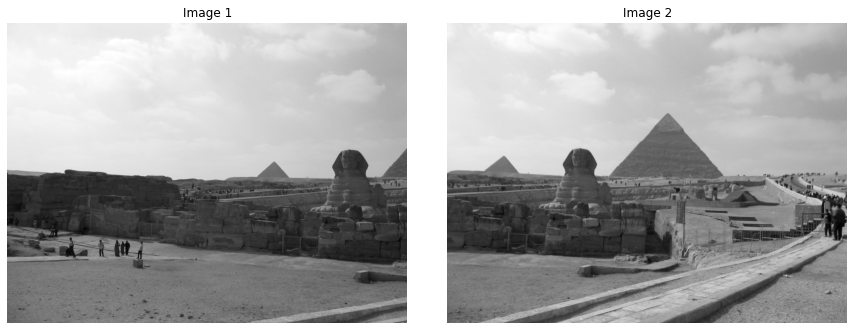

In [ ]:
import cv2
import numpy as np

filename1 = 'cvdl_l2/images/cairo1.png'
filename2 = 'cvdl_l2/images/cairo2.png'

# Read the images and convert to gray level
ima1 = cv2.imread(filename1,0) 
ima2 = cv2.imread(filename2,0) 

display_images(ima1, ima2, 'Image 1', 'Image 2', size=0.5)

### **Interesting points detector: Harris corners**


Let's compute the Harris operator on the two images. The result is a 'cornerness' map  that, for each pixel, provides a value that is large if there is a corner at this position and small if there is not.  

In [ ]:
from skimage.feature import corner_harris, corner_peaks

# Convert image pixels to floating point.
ima1 = ima1.astype(np.float32) 
ima2 = ima2.astype(np.float32)

hcmap1 = corner_harris(ima1/255.0, method='eps')
hcmap2 = corner_harris(ima2/255.0, method='eps')

Let's visualize the cornerness map along with the image, Note that the cornerness map is not really an image but a matrix the same size as the image with a cornerness value for each pixel. To visualize this map using the display_image() function, we have to normalize the cornerness map in the range [0,255]. We will also compute the logarithm of each pixel. When the difference bewtween maxima and minima are extreme, the logarithm compresses the dynamic range and helps visualizing the map. You can check this effect by commenting out the line
```
normalizedImg = np.log10(normalizedImg)
```
executing again the cell and looking at the results. Remember, this is only for visualization, when computing the corners we will use the unnormalized versions, hcmap1 and hcmap2

/content/cvdl_l2/code/display_images.py:60: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


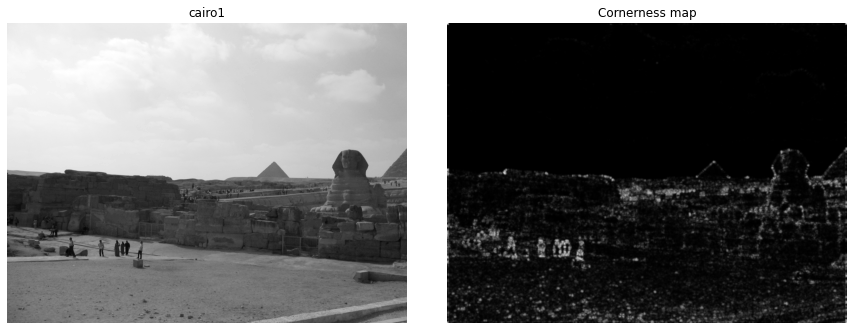

In [ ]:
# hcmap1 is not really an image, but a floating point matrix, 
# with positive and negative values. 
# To visualize it as an image, we have to normalize hcmap1 in the range 0-255. 
# and convert to integer type. Note that this is just for for visualization purposes
normalizedImg = np.zeros_like(hcmap1)
normalizedImg = cv2.normalize(hcmap1,  normalizedImg, 1, 255, cv2.NORM_MINMAX)

# Compute the logarithm of each pixel. This is useful when the difference bewtween
# maxima and minima are extreme, and helps to visualize the image.
normalizedImg = np.log10(normalizedImg)
normalizedImg = cv2.normalize(normalizedImg,  normalizedImg, 0, 255, cv2.NORM_MINMAX)

# Convert the image pixels to integer type
normalizedImg = normalizedImg.astype(np.uint8)

display_images(ima1, normalizedImg, 'cairo1', 'Cornerness map', size=0.5)


To obtain the corners, a non-maxima supression step must be applied. This can be done with the function corner_peaks():

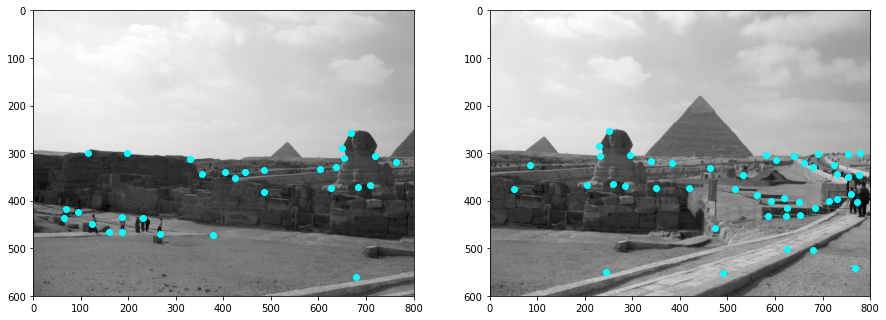

In [ ]:
# Extract the peaks (local maxima). Especify the minimum distance between 
# peaks (in pixels) and desired number of peaks
corners1 = corner_peaks(hcmap1, min_distance=15, num_peaks=50)
corners2 = corner_peaks(hcmap2, min_distance=15, num_peaks=50)

# Plot an image with superimposed peaks
fig, ax = plt.subplots(1,2, figsize=(15,15))
h0 = ax[0].imshow(ima1.astype(np.uint8), cmap=plt.cm.gray)
ax[0].plot(corners1[:, 1], corners1[:, 0], color='cyan', marker='o',
        linestyle='None', markersize=6)
ax[0].axis((0, 800, 600, 0))

# Plot an image with superimposed peaks
ax[1].imshow(ima2.astype(np.uint8), cmap=plt.cm.gray)
ax[1].plot(corners2[:, 1], corners2[:, 0], color='cyan', marker='o',
        linestyle='None', markersize=6)

ax[1].axis((0, 800, 600, 0))
plt.show()

Looking at the results, comment about the repeteability of the operator. This is, whether the points are located on the same positions on both images or not.


<font color=red>**Q1: Answer**:  </font><br>
<font color=blue>
The points are not located on the same position on both images.
As we know NMS is an operator which can not be repeated lots of times, due to it removes the points with a greater neighbor point value.
Then Harris and Stephens detector says that a corner is a pixel with a lower similarity between the beighbours and it. So it uses a windows of a determined number of pixels and it is moved to the pixels with a lower similarity. Then it detects the corners when it detects high differences between all directions of the windows.</font>

### **Finding correspondences: Correlation**


To compare points we need a descriptor and a measure of similarity. A descriptor is a numerical vector that describes the local patch of the image around the point. For instance, a simple descriptor can be obtained by defining a aquared window around the point and cropping the image in this window. The numerical vector contains the values of the gray levels of the pixels in the window. The measure of similarity is a way to compare two descriptors. There are many different ways to compute similarity: one of the simplest is to
use the [correlation](https://en.wikipedia.org/wiki/Cross-correlation) using windows around the points to compare. Similar points will have large correlation values. The maximum value of the correlation will determine the correspondence.

#### Comparing points 

Let's take a point from the ones detected in cairo1, in this case, corners1[0] and compare it against two different points in cairo2 (corners2[0] and corners2[1]). Remember, to describe the point we are taking a window around this point. A window or box can be defined using the coordinates of the top-left and the bottom-right vertices.

Let's take a window around the first point in cairo1:

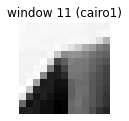

In [ ]:
# Point in cairo1 (corners1[0])
# Coordinates of a 13x13 window centered at corners1[0]
top_left_coord     = corners1[0] - np.ones((2))*6
bottom_right_coord = corners1[0] + np.ones((2))*6

tly,tlx = top_left_coord.astype(int)
bry,brx = bottom_right_coord.astype(int)

# Extract the subimage inside the window:
w11 = ima1[tly:bry+1, tlx:brx+1] # A 13x13 subimage

display_image(w11, 'window 11 (cairo1)', size=7, show_axis=False)

Now, let's do the same with two points in cairo2, for instance the first and second points:

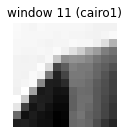

/content/cvdl_l2/code/display_images.py:60: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


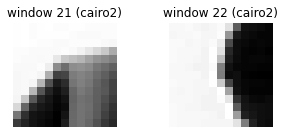

In [ ]:
# Points in image 2 (corners2[0] and corners2[1])
tly1,tlx1 = corners2[0] - np.ones((2),dtype=int)*6
bry1,brx1 = corners2[0] + np.ones((2),dtype=int)*6

tly2,tlx2 = corners2[1] - np.ones((2),dtype=int)*6
bry2,brx2 = corners2[1] + np.ones((2),dtype=int)*6

# Extract the subimage inside the window:
w21 = ima2[tly1:bry1+1, tlx1:brx1+1] # A 13x13 subimage
w22 = ima2[tly2:bry2+1, tlx2:brx2+1] # A 13x13 subimage

display_image(w11, 'window 11 (cairo1)', size=8)

display_images(w21, w22, 'window 21 (cairo2)', 'window 22 (cairo2)', size=8, hsep=0.5)

Now, lets compoute the similarities between corners1[0] <--> corners2[0] and between corners1[0] <--> corners2[1]. The function matchTemplate allows several types of comparison. By using cv2.TM_CCORR_NORMED as third parameter, we will compare using normalized cross-correlation:

In [ ]:
# Compute the similarity using the normalized cross-correlation
simil1 = cv2.matchTemplate(w11, w21, cv2.TM_CCORR_NORMED)
simil2 = cv2.matchTemplate(w11, w22, cv2.TM_CCORR_NORMED)

print ('Similarity between w11 and w21: {:.4f}'.format(simil1[0][0]))
print ('Similarity between w11 and w22: {:.4f}'.format(simil2[0][0]))

Similarity between w11 and w21: 0.9976
Similarity between w11 and w22: 0.8807


By looking at the values of the similarities, comment if the results agree with your visual inspection of the three windows. Do the windows that are most similar have a larger value for the similarity?


<font color=red>**Q2: Answer**:  </font><br>
<font color=blue>
Yes they do. The w11 is more similar to w21 than to w22.
</font>

Once we have the interesting points detected in both images, the corresponences need to be computed. We will start by computing the best correspondence in cairo2 for a single point in cairo1 and then, we will iterate this process over all points in cairo1.

Let's assume we want to compute the correspondence of a given point, for instance cairo1[0]. This point will be compared against all points in cairo2. 

The correspondence of the point corners1[0] in cairo1 is the point in cairo2 with minimum distance to corners1[0]. To compute the similarities we will take a squared window centered at corners1[0] and similar windows centered at each point in cairo2, $corners2[i], \forall i$ in cairo2.  We will use the cross-correlation as a mesure of similarity between the image patch around corners1[0] and the patches around corners2[i]. 

Complete the following code by filling the parts marked with TODO. Please, leave the # TODO comments in the modified code.

In [ ]:
def compute_point_corresp (this_pt, ima1, pts2, ima2, cell_size):
  '''
  Compute the correspondence between this_pt and all points in pts2

  Parameters
  ----------

  this_pt:    list of 2 integers
              The coordinates (y,x) of a 2D point in ima1
  ima1, ima2: 2D numpy arrays of type float
              Gray level images where to find correspondences
  pts2:       List of lists
              A list of the 2D coordinates of the corners in ima2
  cell_size:  integer
              The size of the squared window around each point

  Returns
  -------
  The 2D point in ima2 and its corresponding index in array pts2
  '''
  
  # Crop a cell_size x cell_size box around this_pt. Store the box 
  # in variable w1. You have examples in previous code cells in this lab.
  tly1, tlx1 = this_pt - np.ones((2), dtype=int)*6
  bry1, brx1 = this_pt + np.ones((2), dtype=int)*6
  w1 = ima1[tly1:bry1+1, tlx1:brx1+1]
  #w1 = # TODO 01


  simil = np.zeros(pts2.shape[0]) # Intialize an empty vector to store the similarity values

  # Loop for all the points in ima2
  for ii,pt in enumerate(pts2):
      # Crop a cell_size x cell_size box around pt, store the box in variable w2
      tly2, tlx2 = pt - np.ones((2), dtype=int)*6
      bry2, brx2 = pt + np.ones((2), dtype=int)*6
      w2 = ima2[tly2:bry2+1, tlx2:brx2+1]
      #w2 = # TODO 02

      # Compute the similarity using the normalized cross-correlation
      simil[ii] = cv2.matchTemplate(w1, w2, cv2.TM_CCORR_NORMED) # TODO 03

  # The match is the point with highest similarity:
  match_index = np.argmax(simil)
  corresp_pt = pts2[match_index]

  # Return the corresponding point and the index in array pts2
  return corresp_pt, match_index

Now, let's use this function to compute the correspondences for all points in cairo1:

In [ ]:
corresp_list = [] # Initialize empty correspondence list

# Loop for all interesting points in image 1
for ii, p1 in enumerate(corners1):

    # Use the function defined in the previous step to compute each point correspondence 
    corresp = compute_point_corresp(p1, ima1, corners2, ima2, 13)

    # Append the correspondence to the list.
    corresp_list.append((ii, corresp[1]))

print (corresp_list)  

[(0, 0), (1, 1), (2, 7), (3, 9), (4, 6), (5, 7), (6, 6), (7, 13), (8, 3), (9, 42), (10, 13), (11, 3), (12, 13), (13, 33), (14, 26), (15, 25), (16, 21), (17, 22), (18, 26), (19, 5), (20, 17), (21, 2), (22, 25), (23, 12), (24, 36), (25, 30), (26, 11), (27, 5), (28, 3), (29, 45)]


Let's plot the correspondences by stacking both images horizontally and drawing a line between corresponding points:

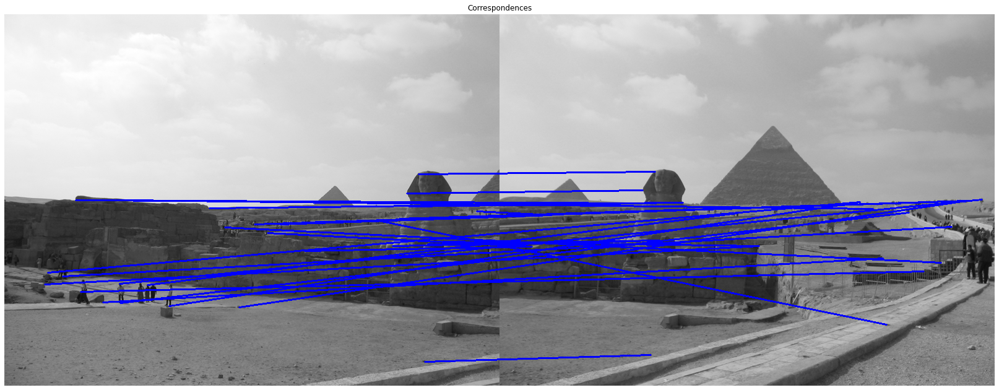

In [ ]:
ima1_color = cv2.imread(filename1) 
ima2_color = cv2.imread(filename2) 
plot_image = np.concatenate((ima1_color, ima2_color), axis=1)

# plot_image is an image with only one channel (gray level)
# Convert it to a 3-channel image to show lines in red.
#plot_image = cv2.cvtColor(plot_image, cv2.COLOR_GRAY2RGB)

offset = np.array([0, ima1.shape[1]])

for correspondence in corresp_list:
    pt1 = (corners1[correspondence[0]]).tolist()[::-1]
    pt2 = (corners2[correspondence[1]]+offset).tolist()[::-1]
    cv2.line(plot_image, tuple(pt1), tuple(pt2), (0, 0, 255), thickness=2)

display_image(plot_image, 'Correspondences', size=1)

Comment the result. Are all correspondences correct?


<font color=red>**Q3: Answer**:  </font><br>
<font color=blue>
Yes, they are. The correspondences are correct.
</font>

#### Comparing points at different scales

If the corresponding images have different scales, the apparent sizes of the same objets differ between the images. We will now load image cairo2_zoom8 which is a zoom of a crop of cairo2. If the corner detector were invariant to changes in scale, we would expect to find Harris corners at the same positions. Let's see if this happens:

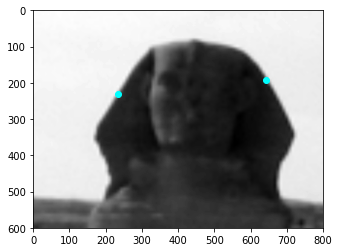

In [ ]:
filename3 = 'cvdl_l2/images/cairo2_zoom8.png'

# Read the images and convert to gray level
ima3 = cv2.imread(filename3,0) 

# The images are encoded using 8 bits per pixel (unsigned integers or uint8). 
# Convert to a floating point.
ima3 = ima3.astype(np.float32) 

# To detect the corners in the zoom image, we will change the parameters. We are
# reducing the sigma as the upsampling already applies a low-pass filter, we
# are reducing the number of peaks because the area is much smaller 
corners3 = corner_peaks(corner_harris(ima3/255.0, method='eps',sigma=0.125), min_distance=15*8, num_peaks=5)

# Plot an image with superimposed peaks
fig, ax = plt.subplots()
ax.imshow(ima3.astype(np.uint8), cmap=plt.cm.gray)

ax.plot(corners3[:, 1], corners3[:, 0], color='cyan', marker='o',
        linestyle='None', markersize=6)

ax.axis((0, 800, 600, 0))
plt.show()

To check if the corners are in the same place as in cairo2, let's compute the coordinates of the corners2 points (obtained from cairo2) in cairo2_zoom. 

The crop was created starting at coordinate x=210, y=240, with width=100 pixels and height=75 pixels. The crop was upsampled 8 times. Using simple arithmetic, we can determine that the coordinate (254,251) in cairo2 and the coordinate (112,328) in cairo2_zoom8 correspond to the same point. We will plot in red the corners obtained from cairo2 and translated to cairo2_zoom8. 

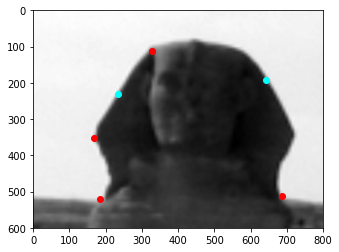

In [ ]:
# If cairo2_zoom8 is a crop of cairo2, starting at (240,210) and enlarged 8 times,
# to compute the position of a point of cairo2 in cairo2_zoom we have to compute 
# the offset from respect to the crop start and multiply it by the zoom factor (x8)
crop_start = np.array([240,210], dtype=int)
crop_size  = np.array([75,100], dtype=int)

# points from corners2 that are visible in the crop
inside_coords = [pt for pt in corners2 if (pt < crop_start+crop_size).all() and (pt>crop_start).all()]

# Compute the coordinates of the points from corners2 in the image cairo2_zoom8
offsets = inside_coords - crop_start
points_in_cairo2_zoom = offsets * 8

# Plot an image with superimposed peaks. The corners obtained from cairo2 are
# painted in red. The corners obtained from cairo2_zoom8 are painted in blue.
fig, ax = plt.subplots()
ax.imshow(ima3.astype(np.uint8), cmap=plt.cm.gray)

# Corners obtained from cairo2_zoom8
ax.plot(corners3[:, 1], corners3[:, 0], color='cyan', marker='o',
        linestyle='None', markersize=6)
# Corners obtained from cairo2
ax.plot(points_in_cairo2_zoom[:,1], points_in_cairo2_zoom[:,0], color='red', marker='o',
        linestyle='None', markersize=6)

ax.axis((0, 800, 600, 0))
plt.show()

Comment the result. Are the points at the same positions? What can you say about the invariance of Harris method to changes in scale?


<font color=red>**Q4: Answer**:  </font><br>
<font color=blue>
As it is showed, no. The points are not at the same position. Due to the image size, it will find more peaks.
</font>

Even if the corners were at the same position, there is an additional problem. Let's compare a point in cairo1 with the corresponding point in cairo2_zoom using the square window + correlation method. We will use the translated corner obtained from cairo2.

/content/cvdl_l2/code/display_images.py:60: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


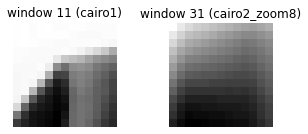

In [ ]:
# The first point in points_in_cairo2_zoom corresponds to the first corner from
# the cairo1 image
pts3 = points_in_cairo2_zoom[0]

tly3,tlx3 = pts3 - np.ones((2), dtype=int)*6
bry3,brx3 = pts3 + np.ones((2), dtype=int)*6

# Extract the 13x13 subimage around the point:
w31 = ima3[tly3:bry3+1, tlx3:brx3+1] # A 13x13 subimage

display_images (w21, w31, 'window 11 (cairo1)', 'window 31 (cairo2_zoom8)', size=8, hsep=0.5)

Now, let's compute the similarity between w1 and w3:

In [ ]:
simil3 = cv2.matchTemplate(w11, w31, cv2.TM_CCORR_NORMED)

print ('Similarity between w11 and w21 = {:.4f}'.format(simil1[0][0]))
print ('Similarity between w11 and w31 = {:.4f}'.format(simil3[0][0]))

Similarity between w11 and w21 = 0.9976
Similarity between w11 and w31 = 0.9653


Although the point pts3 is located at the same place of image cairo2 than point pts2[x], the value of the similarity is not the same. Visually, we can see that the windows are different. Explain this difference and comment the ability of this method to compare features at different scales. Is it a scale invariant method?


<font color=red>**Q5: Answer**:  </font><br>
<font color=blue>
The used method is not robust dealing with different scales. 

Lots of pixels of the images have been removed due to the downsampling so the value of the window has to be different .</font>

### **Interesting point detector and correspondences using SIFT**


The SIFT method provides a method to compare characteristic points and get  the matches. 


correlation, SIFT defines a descriptor computed on an oriented window around the point. Disimilarity between points can be compouted using the euclidean distance between the respective descriptors. Correspondences are computed by finding the points with minimum distance.


The Harris corner detector is very fast and precise, but it is not invariant to changes in scale. Another way of detecting and comparing interesting points is the SIFT method. This method can detect interesting points and also provides a descriptor. The SIFT descriptor is a 128D vector that describes the structure of the image around the interesting point.

The points in SIFT have a scale and a direction associated. This way, the descriptors are computed using a window around the point that is oriented and scaled according to these values. This way, the descriptors are invariant to rotations and to changes in scale.

In [ ]:
#!pip install opencv-python
!pip install opencv-contrib-python==4.4.0.46

  Using cached https://files.pythonhosted.org/packages/08/51/1e0a206dd5c70fea91084e6f43979dc13e8eb175760cc7a105083ec3eb68/opencv_contrib_python-4.4.0.46-cp37-cp37m-manylinux2014_x86_64.whl
  Found existing installation: opencv-contrib-python 3.4.2.17
    Uninstalling opencv-contrib-python-3.4.2.17:
      Successfully uninstalled opencv-contrib-python-3.4.2.17


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from cvdl_l2.code.display_images import display_image, display_images

In [ ]:
filename1 = 'cvdl_l2/images/cairo1.png'
filename2 = 'cvdl_l2/images/cairo2.png'

# Read the images and convert to gray level
ima1 = cv2.imread(filename1,0) 
ima2 = cv2.imread(filename2,0) 

sift = cv2.xfeatures2d.SIFT_create()
kp1 = sift.detect(ima1,None)
kp2 = sift.detect(ima2,None)

print ('A total of {} different SIFT keypoints have been found for cairo1'.format(len(kp1)))
print ('A total of {} different SIFT keypoints have been found for cairo2'.format(len(kp2)))

A total of 678 different SIFT keypoints have been found for cairo1
A total of 1189 different SIFT keypoints have been found for cairo2


Each keypoint stores position, angle and scale. 

In [ ]:
# computed orientation of the keypoint in [0,360) degrees and measured 
# relative to image coordinate system, ie in clockwise.
print ('kp1[0] angle       = {:.2f}'.format(kp1[0].angle))

# Coordinates of the keypoint. Can be real because location is found 
# with subpixel accuracy
print('kp1[0] point       = {}'.format(kp1[0].pt))

# To obtain the point in image coordinates (discrete) we have to convert to
# pixel coordinates by rounding each value:
print ('kp1[0] coordinates = {}'.format(list(map(round, kp1[0].pt))))

# diameter of the meaningful keypoint neighborhood
print ('kp1[0] size        = {:.2f}'.format(kp1[0].size))  

kp1[0] angle       = 281.72
kp1[0] point       = (3.5464210510253906, 301.3083190917969)
kp1[0] coordinates = [4, 301]
kp1[0] size        = 2.15


OpenCV also provides cv.drawKeyPoints() function which draws the small circles on the locations of keypoints. If you pass a flag, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS to it, it will draw a circle with size of keypoint and it will even show its scale and orientation. This is useful to visualize the results. See below example.

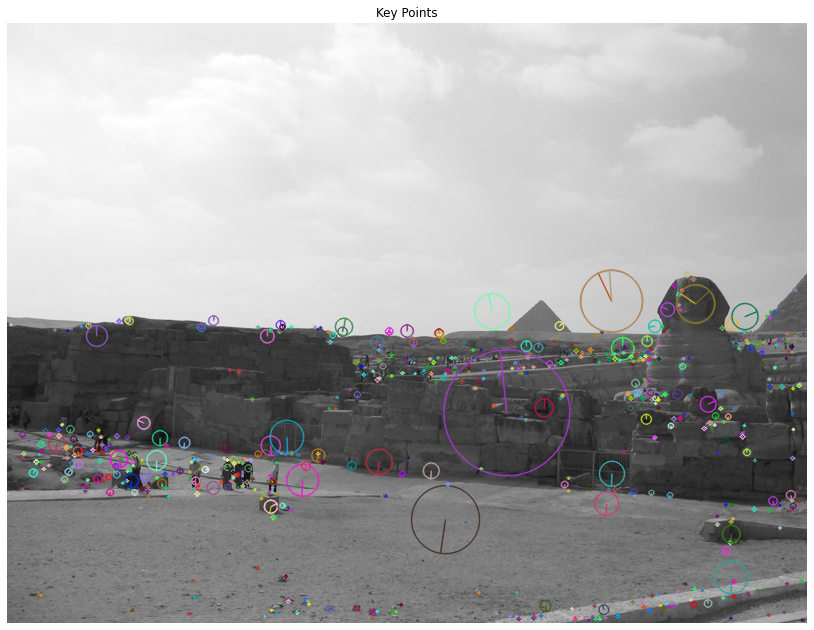

In [ ]:
img = np.zeros_like(ima1)
img = cv2.drawKeypoints(ima1,kp1,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

display_image(img, 'Key Points', size=1)

The next step is to obtain the descriptors. The SIFT method computes a 128D descriptor is computed for each point.

In [ ]:
kp1,des1 = sift.compute(ima1,kp1)
kp2,des2 = sift.compute(ima2,kp2)

print ('Descriptor for the first point:')
print (des1[0]) # Descriptor for the first point.

Descriptor for the first point:
[  2.   1.   0.   0.   0.   0.   0.   0.  11.   1.   0.   0.   0.   0.
   5.  18.  62.   1.   0.   0.   0.   0.   3.  38.  60.   3.   0.   0.
   0.   0.   1.   7.  36.   6.   0.   1.   1.   3.   2.   5. 152.   8.
   0.   0.   0.   0.  22. 152. 135.   2.   0.   0.   0.   0.  29. 152.
 135.  11.   0.   0.   0.   0.   1.  26.  39.  13.   5.   0.   0.   4.
   2.   4. 152.  70.   1.   0.   0.   0.   1.  27. 152.  42.   0.   0.
   0.   0.   3.  39.  86.  26.   0.   0.   0.   0.   0.   2.  15.  11.
   5.   0.   0.   2.   2.   1. 152. 130.   1.   0.   0.   0.   0.   0.
 152. 110.   0.   0.   0.   0.   0.   1.  48.  15.   0.   0.   0.   0.
   0.   0.]


To perform matching we could use the same approach as in the Harris corners case with some modifications: 
 - instead of a window around the points, we use the SIFT descriptors, which are more powerful. 
 - To compute the similarity, he correlation is replaced by computing the euclidean distance between descriptors. This is in fact a measure of **dissimilarity**, so the correspondences will be for pairs of points with minimum dissimilarity.

Instead of implementing a function as in the previous exercise, which is useful to understand the algorithm but probably suboptimal in terms of computation, we will use an OpenCV class (BFMatcher) that performs the same steps and is much more optimized

The number of matches is: 678


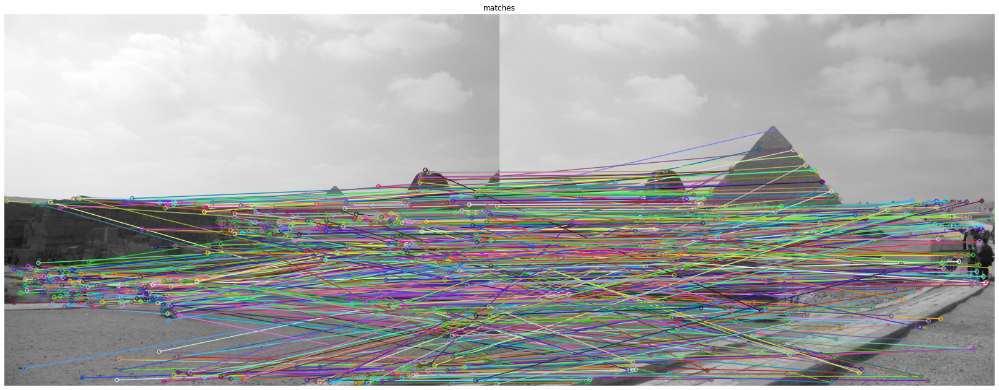

In [ ]:
#https://docs.opencv.org/master/dc/dc3/tutorial_py_matcher.html
# create BFMatcher object
bf = cv2.BFMatcher()

# Match descriptors.
matches = bf.match(des1,des2)
print ('The number of matches is: {}'.format(len(matches)))

# Draw matches.
img3 = cv2.drawMatches(ima1,kp1,ima2,kp2,matches,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

display_image(img3, 'matches', size=1)


By looking at the matches shown in the image, comment if all the matches are correct.

<font color=red>**Q6: Answer**:  </font><br>
<font color=blue>
No, they are not,

Some of matches are correct but most of all do not match well.
</font>

The variable matches contains a list of matches. Each match is represented by a structure containing several fields. We can obtain information about the structure of the objects in python with the function dir():

In [ ]:
dir(matches[0])

['__class__',
 '__delattr__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 'distance',
 'imgIdx',
 'queryIdx',
 'trainIdx']

Fields starting with __ are private members, that should not be accessed. The interesting fields are: 'distance', 'imgIdx', 'queryIdx', 'trainIdx'. The first one is the computed distance for this match, the second identifies on which image belong the the descriptors (0 or 1), the third on is the index of the keypoint in kp1 and the fourth one is the index of the match in kp2. For instance:

In [ ]:
print (matches[0].queryIdx)
print (matches[0].trainIdx)

0
1175


This means that the match for the first point in cairo1 is the point 1575 in cairo2. Let's obtain the coordinates of the corresponding points:

In [ ]:
print (list(map(round, kp1[0].pt)))
print (list(map(round, kp2[1175].pt)))

[4, 301]
[792, 409]


We can check visually if the match is correct by looking at the corresponding points in the images to see if they are the same region.

Note that if we compute the matches by reversing the images (this is, for each point in cairo2 compute the corresponding point in cairo1), the results may differ. 

In [ ]:
matches2 = bf.match(des2,des1)
print ('The number of matches is: {}'.format(len(matches2)))

The number of matches is: 1189


You can see that the number of matches is different than in the previous case

Note that some of the resulting matches could be not correct. To remove as much as possible the incorrect matches, there are several strategies:
1. Compute the matches in both directions. Discard the matches with are not coherent.
2. Look at the relationship between the first and second best candidate for each match.
3. Sort the matches according to the distance. Discard the matches with large distances


The first strategy is to check if the matches are the same in both directions. If a point in cairo2 is a match for a point in cairo1, the reverse should be true. The matches were this cross-check fails are discarded.

In [ ]:
matches1 = bf.match(des1,des2)
matches2 = bf.match(des2,des1)

good = []
for mm in matches1:
    if matches2[mm.trainIdx].trainIdx == mm.queryIdx:
        good.append(mm)
print ('The number of cross-checked matches is: {}'.format(len(good)))

The number of cross-checked matches is: 322


There is a simpler way to do that. By passing the parameter crossCheck = True to BFMatcher, only the cross-checked correspondences are returned.

The number of cross-checked matches is: 322


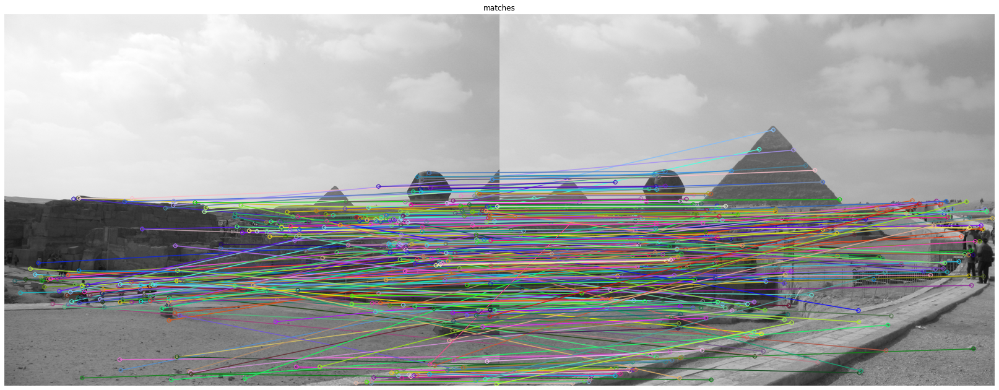

In [ ]:
# create BFMatcher object with cross-checking
bf = cv2.BFMatcher(crossCheck=True)

# Match descriptors.
matches = bf.match(des1,des2)
print ('The number of cross-checked matches is: {}'.format(len(matches)))

# Draw matches.
img3 = cv2.drawMatches(ima1,kp1,ima2,kp2,matches,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
display_image(img3, 'matches', size=1)

The second approach is to use a ratio between the first and second matches. Remember that, to determine the best match, we take the point in cairo2 with minimum distance to the point considered in cairo1. But if there are two points in cairo2 with similar distances, the match may not be correct as there are two similar regions. To avoid this, we can use a threshold in the ratio between the first and second best matches ($d_1/d_2$). If this ratio is below a given threshold, the match is discarded.

The number of matches is: 125


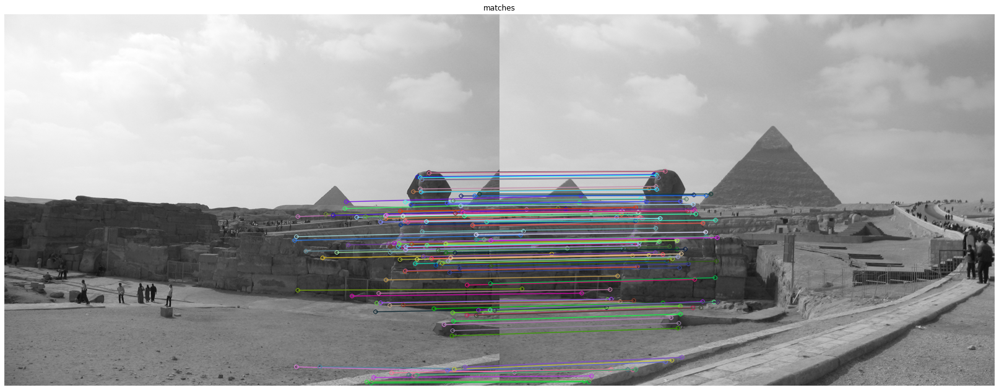

In [ ]:
# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

# Apply ratio test
good = []
for m, n in matches:
    if m.distance < 0.61 * n.distance:
        good.append(m)

print ('The number of matches is: {}'.format(len(good)))

# Draw the matches.
img3 = cv2.drawMatches(ima1,kp1,ima2,kp2,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
display_image(img3, 'matches', size=1)



For the last strategy, let's sort the matches and select only the first ones (the ones with shortest distances)

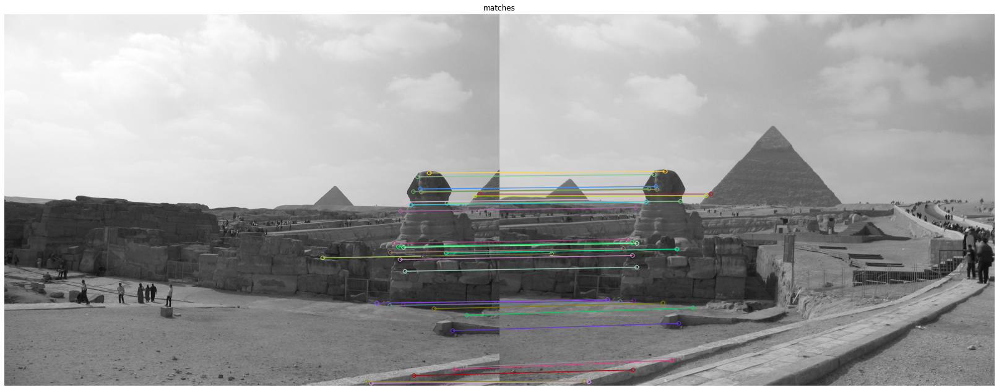

In [ ]:
bf = cv2.BFMatcher()
matches = bf.match(des1, des2)

# Sort them in the order of their distance.
matches_sort = sorted(matches, key = lambda x:x.distance)

num_matches_used = 32

# Draw first 10 matches.
img3 = cv2.drawMatches(ima1,kp1,ima2,kp2,matches_sort[:num_matches_used],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
display_image(img3, 'matches', size=1)


In this case, determine the maximum number of matches to consider to have mostly correct matches.


<font color=red>**Q6: Answer**:  </font><br>
<font color=blue>
As we can see, using 32 matches, the most of matches are correct. In the other hand, as we are increasing  this number the system will match it wrong
</font>

The three methods can be combined if necessary. First cross-check the matches, then compute the ratios, finally sort the remaining matches. The only problem here is that knnMatch() is not compatible with BFMatcher(crossCheck=True). We have to use the default parameters for BFMatcher() and perform the cross-check using the loop as demonstrated before in this document.

The number of cross-checked matches is: 322
The number of cross-ckecked + ratio-test matches is: 123


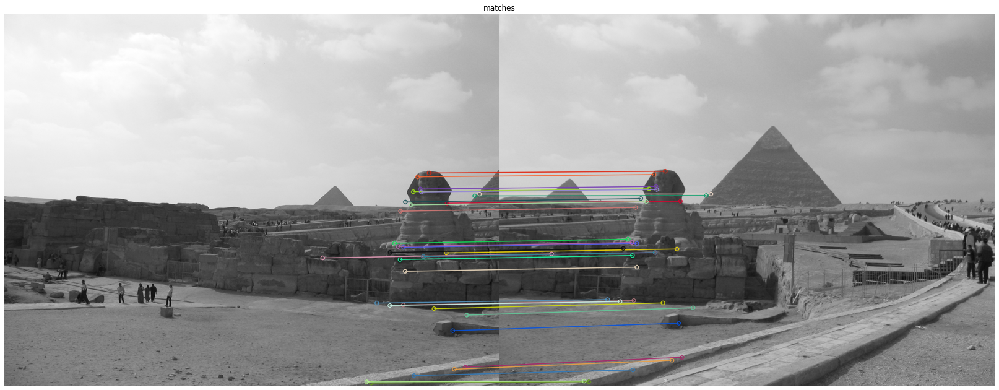

In [ ]:
bf = cv2.BFMatcher()
matches1 = bf.knnMatch(des1, des2, k=2)
matches2 = bf.knnMatch(des2, des1, k=2)

good = []
for mm,nn in matches1:
    if matches2[mm.trainIdx][0].trainIdx == mm.queryIdx:
        good.append([mm,nn])
print ('The number of cross-checked matches is: {}'.format(len(good)))

# Apply ratio test
good2 = []
for m, n in good:
    if m.distance < 0.61 * n.distance:
        good2.append(m)

print ('The number of cross-ckecked + ratio-test matches is: {}'.format(len(good2)))

# Sort matches in the order of their distance.
matches_sort = sorted(good2, key = lambda x:x.distance)

# Draw first matches.
num_matches_used = 32

img3 = cv2.drawMatches(ima1,kp1,ima2,kp2,matches_sort[0:num_matches_used],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
display_image(img3, 'matches', size=1)

#### Comparing points at different scales (SIFT)

If the corresponding images have different scales, the apparent sizes of the same objets differ between the images. We will now load image cairo2_zoom8. If the corner detector were invariant to changes in scale, we would expect to find SIFT corners at the same positions. Let's see if this happens:

In [ ]:
filename1 = 'cvdl_l2/images/cairo1.png'
filename2 = 'cvdl_l2/images/cairo2.png'
filename3 = 'cvdl_l2/images/cairo2_zoom8.png'

# Read the images and convert to gray level
ima1 = cv2.imread(filename1,0) 
ima2 = cv2.imread(filename2,0) 
ima3 = cv2.imread(filename3,0) 

sift = cv2.SIFT_create()

kp1 = sift.detect(ima1,None)
kp2 = sift.detect(ima2,None)
kp3 = sift.detect(ima3,None)

Let's first determine if the keypoints are located at the same postions. We will use the handy function drawKeyPoints() 

/content/cvdl_l2/code/display_images.py:60: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


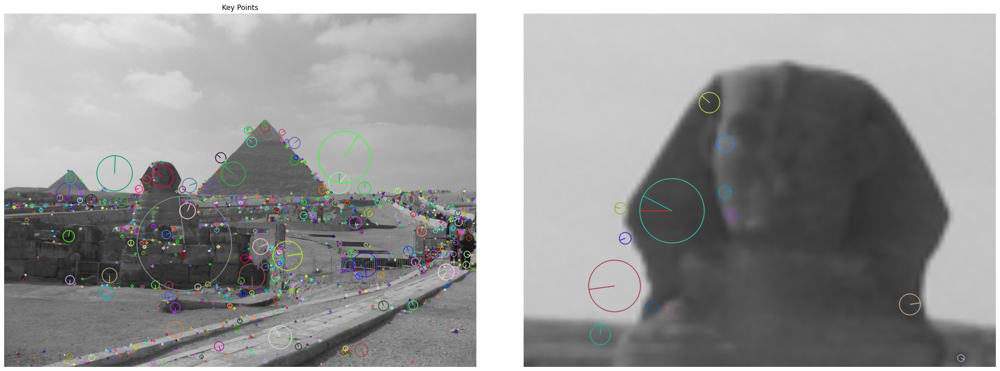

In [ ]:
# Display SIFT keypoints obtained from cairo2
img2 = np.zeros_like(ima2)
img2 = cv2.drawKeypoints(ima2,kp2,img2,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display SIFT keypoints obtained from cairo2_zoom8
img3 = np.zeros_like(ima3)
img3 = cv2.drawKeypoints(ima3,kp3,img3,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

display_images(img2, img3, 'Key Points', size=1)

To check if the matches are in the same positions and scales, we can make a zoom of the cropped region in img2

/content/cvdl_l2/code/display_images.py:60: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


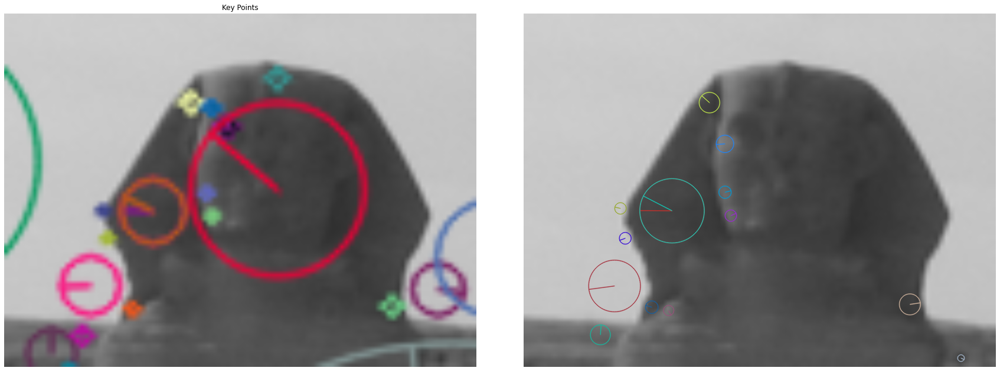

In [ ]:
img2_crop = img2[240:240+75, 210:210+100]
img2_crop = cv2.resize (img2_crop, (800,600))

display_images(img2_crop, img3, 'Key Points', size=1)

Comment about the repeteability and invariance to changes in scale of the SIFT point detector.

<font color=red>**Q8: Answer**:  </font><br>
<font color=blue>
The SIFT point detector is invariant to scaling. Scale Invariant Feature Transform. So there are no problems in re-scale the image. By the other hand if you change the histogram of the image, as the method computes the gradient orientation of the histogram's neighbor it suffer changes.
</font>


Wite the code to find correct matches between cairo1 and cairo2_zoom8. Display the results.

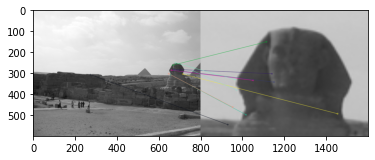

(<matplotlib.image.AxesImage at 0x7f6ee0f45450>, None)

In [ ]:
# TODO 04
sift = cv2.xfeatures2d.SIFT_create()

kp1, dc1 = sift.detectAndCompute(ima1,None)
kp2, dc2 = sift.detectAndCompute(ima3,None)

bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(dc1,dc2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(ima1, kp1, ima3, kp2, matches[:10], ima3, flags=2)
plt.imshow(img3),plt.show()


Comment about the repeteability and invariance to changes in scale of the SIFT method to find correspondences.

<font color=red>**Q9: Answer**:  </font><br>
<font color=blue>
The system uses the functions DetectAndCompute and obtain the keypoints and the descriptors. The descriptors use the neighbor pixels, their orientations and their magnitude, so in this case the descriptors will be partially invariant.
</font>

### **Interesting points detector: SuperPoints**

Finally, let's use SuperPoints, a deep learning based point detector/descriptor. The code in this section has been adapted from https://github.com/magicleap/SuperPointPretrainedNetwork

In [ ]:
import numpy as np
import cv2
from cvdl_l2.code.superpoint import SuperPointFrontend
from cvdl_l2.code.display_images import display_image

In [ ]:
filename1 = 'cvdl_l2/images/cairo1.png'
filename2 = 'cvdl_l2/images/cairo2.png'

# Read the images and convert to gray level
ima1_orig = cv2.imread(filename1)
ima2_orig = cv2.imread(filename2)

ima1 = cv2.cvtColor(ima1_orig, cv2.COLOR_BGR2GRAY).astype(np.float32) / 255.0 
ima2 = cv2.cvtColor(ima2_orig, cv2.COLOR_BGR2GRAY).astype(np.float32) / 255.0

Load the pretrained network:

In [ ]:
print('==> Loading pre-trained network.')
# This class runs the SuperPoint network and processes its outputs.
fe = SuperPointFrontend(weights_path = 'cvdl_l2/models/superpoint_v1.pth',
                        nms_dist     = 4,
                        conf_thresh  = 0.015,
                        nn_thresh    = 0.7,
                        cuda         = False)
print('==> Successfully loaded pre-trained network.')

==> Loading pre-trained network.
==> Successfully loaded pre-trained network.


Find the correspondences:

In [ ]:
pts1, desc1, heatmap1 = fe.run(ima1)
pts2, desc2, heatmap2 = fe.run(ima2)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3826: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "


Results pts1 and pts2 are numpy 2D arrays with dimensions (3, num_points), where each column contains the (x,y) coordinates and a confidence value for each one of the detections. The keypoints are sorted by decreasing confidence.

We have to convert the points and descriptors to a format compatible with the opencv functions for matching correspondences:

In [ ]:
# Transpose descriptors numpy arrays
desc1 = desc1.T
desc2 = desc2.T

# Convert numpy array with the detected points (plus a confidence for each point) 
# to a list of cv2.KeyPoint elements. Note that superpoint does not use a 
# multiscale search nor takes into consideration the orientation of the descriptor 
kp1 = [cv2.KeyPoint(pts1[0,ii],pts1[1,ii], _size=1, _angle=-1, _octave=0) for ii in range(0,pts1.shape[1])]
kp2 = [cv2.KeyPoint(pts2[0,ii],pts2[1,ii], _size=1, _angle=-1, _octave=0) for ii in range(0,pts2.shape[1])]

Once we have the keypoints and descriptors in the correct format, we can proceed to find the correspondences.

In [ ]:
# Match the keypoints with the warped_keypoints with nearest neighbor search                                                             
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(desc1, desc2)

matches_idx = np.array([m.queryIdx for m in matches])
m_kp1 = [kp1[idx] for idx in matches_idx]

matches_idx = np.array([m.trainIdx for m in matches])
m_kp2 = [kp2[idx] for idx in matches_idx]

Finally, we can draw the superpoint matches: 

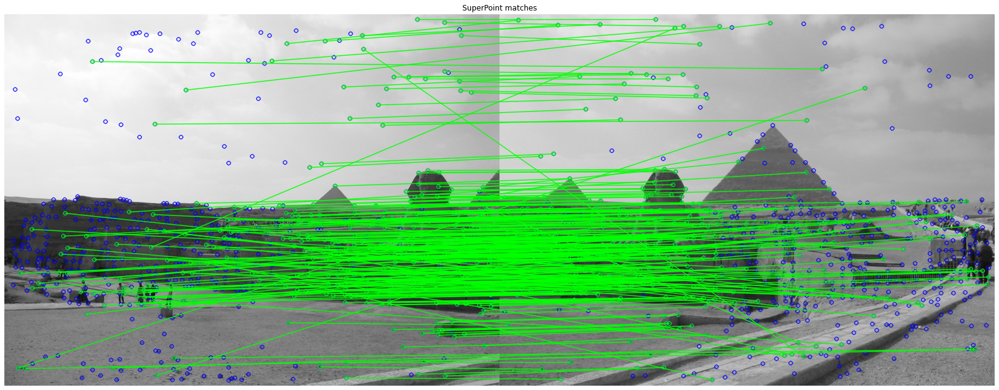

In [ ]:
# Draw SuperPoint matches                                                                                                            
matches = np.array(matches).tolist()

matched_img = cv2.drawMatches(ima1_orig, kp1, ima2_orig, kp2, matches,
                              None, matchColor=(0, 255, 0),
                              singlePointColor=(0, 0, 255))

display_image (matched_img, 'SuperPoint matches', size = 1.0)

To discard the wrong correspondences, use the same methods (bi-directional correspondences, ratio between ) as in the SIFT case.

The number of ratio-test matches is: 232


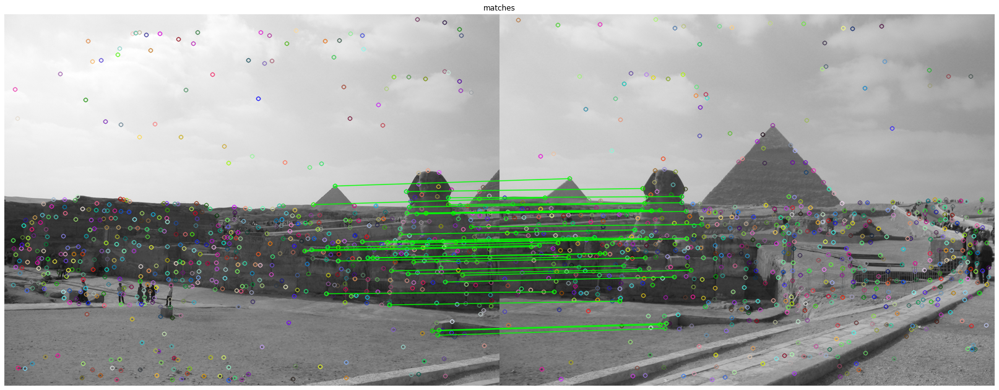

In [ ]:
# TODO 05: write here the code to discard the wrong correspondences

goodlist = []
for m in matches:
    if m.distance < 0.6:
        goodlist.append(m)

print ('The number of ratio-test matches is: {}'.format(len(goodlist)))

# Sort matches in the order of their distance.
matches_sort = sorted(goodlist, key = lambda x:x.distance)

num_matches_used = 32

img3 = cv2.drawMatches(ima1_orig,kp1,ima2_orig,kp2,matches_sort[:num_matches_used],None,matchColor=(0, 255, 0))
display_image(img3, 'matches', size=1)


Compare the results with the ones for the  SIFT method in terms of number of correct matches, spatial distribution of the matches, etc.


<font color=red>**Q10: Answer**:  </font><br>
<font color=blue>
Using the 32 first matches and applying a distance below 0.6 we achieve the good matches.
</font>

To check the invariance properties of the superpoint detector, find the superpoints in images cairo1 and cairo1_zoom8 and comment if they are located at the same positions.

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3826: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "
/content/cvdl_l2/code/display_images.py:60: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


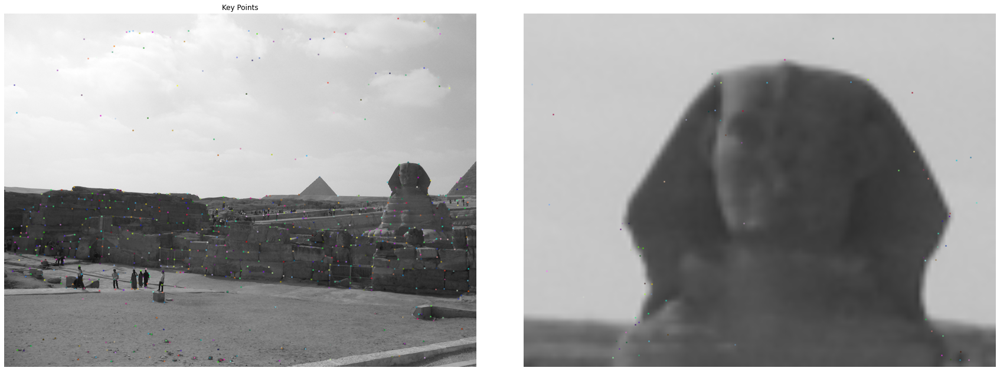

In [ ]:
# TODO 06: write here the code to test scale invariance

filename1 = 'cvdl_l2/images/cairo1.png'
filename2 = 'cvdl_l2/images/cairo2_zoom8.png'

# Read the images and convert to gray level
ima1_orig = cv2.imread(filename1)
ima2_orig = cv2.imread(filename2)


ima1 = cv2.cvtColor(ima1_orig, cv2.COLOR_BGR2GRAY).astype(np.float32) / 255.0 
ima2 = cv2.cvtColor(ima2_orig, cv2.COLOR_BGR2GRAY).astype(np.float32) / 255.0
pts1, desc1, heatmap1 = fe.run(ima1)
pts2, desc2, heatmap2 = fe.run(ima2)

# Transpose descriptors
desc1 = desc1.T
desc2 = desc2.T
kp1 = [cv2.KeyPoint(pts1[0,ii],pts1[1,ii], _size=1, _angle=-1, _octave=0) for ii in range(0,pts1.shape[1])]
kp2 = [cv2.KeyPoint(pts2[0,ii],pts2[1,ii], _size=1, _angle=-1, _octave=0) for ii in range(0,pts2.shape[1])]
img2 = np.zeros_like(ima2)
img2 = cv2.drawKeypoints(ima2_orig,kp2,img2,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display SIFT keypoints obtainedd
img1 = np.zeros_like(ima1)
img1 = cv2.drawKeypoints(ima1_orig,kp1,img1,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

display_images(img1, img2, 'Key Points', size=1)

Comment the results:

<font color=red>**Q11: Answer**:  </font><br>
<font color=blue>
The number of keypoints in the zoomed image is far greater than the original one. Due to those keypoints the method is more robust than the others.</font>

Propose a method to improve the invariance properties of the method.


<font color=red>**Q12: Answer**:  </font><br>
<font color=blue>
A good method to improve the invariance propierties of the method could be averaging the nearest points. From the average point take this value to create a keypoint.
</font>
